# Multivariate data analysis of the Spotify Tracks dataset

## Imports and installs

In [1]:
%pip install datasets

Note: you may need to restart the kernel to use updated packages.


In [1]:
# imports
try:
    # Data manipulation libraries
    import pandas as pd
    import numpy as np

    # Visualization libraries
    import matplotlib.pyplot as plt
    import seaborn as sns
    import altair as alt

    # Machine learning
    from sklearn import datasets
    from sklearn.preprocessing import LabelEncoder
    from sklearn.preprocessing import StandardScaler
    from sklearn.decomposition import TruncatedSVD
    from sklearn.decomposition import PCA
    from sklearn.manifold import TSNE
    import umap

    print("All required libraries are already installed!")
except ImportError as e:
    print(f"Missing library: {e}")

from datasets import load_dataset


All required libraries are already installed!


In [2]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD
from scipy.stats import skew
import seaborn as sns

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA


## Load the dataset + early analysis

### Load the dataset

In [3]:
dataset = load_dataset("maharshipandya/spotify-tracks-dataset")

README.md:   0%|          | 0.00/4.68k [00:00<?, ?B/s]

dataset.csv:   0%|          | 0.00/20.1M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/114000 [00:00<?, ? examples/s]

### Early exploratory analysis

In [4]:
print(dataset)
# Nr of observations is 114000

DatasetDict({
    train: Dataset({
        features: ['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name', 'popularity', 'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature', 'track_genre'],
        num_rows: 114000
    })
})


In [5]:
df = pd.DataFrame(dataset['train'])

In [6]:
print(df.head(20))

    Unnamed: 0                track_id                               artists  \
0            0  5SuOikwiRyPMVoIQDJUgSV                           Gen Hoshino   
1            1  4qPNDBW1i3p13qLCt0Ki3A                          Ben Woodward   
2            2  1iJBSr7s7jYXzM8EGcbK5b                Ingrid Michaelson;ZAYN   
3            3  6lfxq3CG4xtTiEg7opyCyx                          Kina Grannis   
4            4  5vjLSffimiIP26QG5WcN2K                      Chord Overstreet   
5            5  01MVOl9KtVTNfFiBU9I7dc                          Tyrone Wells   
6            6  6Vc5wAMmXdKIAM7WUoEb7N  A Great Big World;Christina Aguilera   
7            7  1EzrEOXmMH3G43AXT1y7pA                            Jason Mraz   
8            8  0IktbUcnAGrvD03AWnz3Q8             Jason Mraz;Colbie Caillat   
9            9  7k9GuJYLp2AzqokyEdwEw2                        Ross Copperman   
10          10  4mzP5mHkRvGxdhdGdAH7EJ                          Zack Tabudlo   
11          11  5ivF4eQBqJiVL5IAE9jRyl  

In [7]:
df.shape

(114000, 21)

In [8]:
print(df.columns)

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')


In [9]:
print(df.describe())

          Unnamed: 0     popularity   duration_ms   danceability  \
count  114000.000000  114000.000000  1.140000e+05  114000.000000   
mean    56999.500000      33.238535  2.280292e+05       0.566800   
std     32909.109681      22.305078  1.072977e+05       0.173542   
min         0.000000       0.000000  0.000000e+00       0.000000   
25%     28499.750000      17.000000  1.740660e+05       0.456000   
50%     56999.500000      35.000000  2.129060e+05       0.580000   
75%     85499.250000      50.000000  2.615060e+05       0.695000   
max    113999.000000     100.000000  5.237295e+06       0.985000   

              energy            key       loudness           mode  \
count  114000.000000  114000.000000  114000.000000  114000.000000   
mean        0.641383       5.309140      -8.258960       0.637553   
std         0.251529       3.559987       5.029337       0.480709   
min         0.000000       0.000000     -49.531000       0.000000   
25%         0.472000       2.000000     -1

In [10]:
print(df.isnull().sum())

Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64


In [11]:
#save the data to a csv file
# df.to_csv('spotify_tracks.csv', index=False)

In [12]:
print("\nData types of each column:")
for col in df.columns:
    print(f'{col}: {df[col].dtype}')


Data types of each column:
Unnamed: 0: int64
track_id: object
artists: object
album_name: object
track_name: object
popularity: int64
duration_ms: int64
explicit: bool
danceability: float64
energy: float64
key: int64
loudness: float64
mode: int64
speechiness: float64
acousticness: float64
instrumentalness: float64
liveness: float64
valence: float64
tempo: float64
time_signature: int64
track_genre: object


### Removal of data

#### Removal of irrelavant column

In [13]:
df.drop(columns=['Unnamed: 0'], axis=1, inplace=True)

In [14]:
df.shape


(114000, 20)

#### Removal of NaN values

In [15]:
df.dropna(inplace=True)

In [16]:
df.shape

(113999, 20)

In [17]:
df.isna().sum()


track_id            0
artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

#### Removal of duplicates

In [18]:
num_duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 450


In [19]:
df = df.drop_duplicates()

In [20]:
df.shape

(113549, 20)

## Exploratory analysis

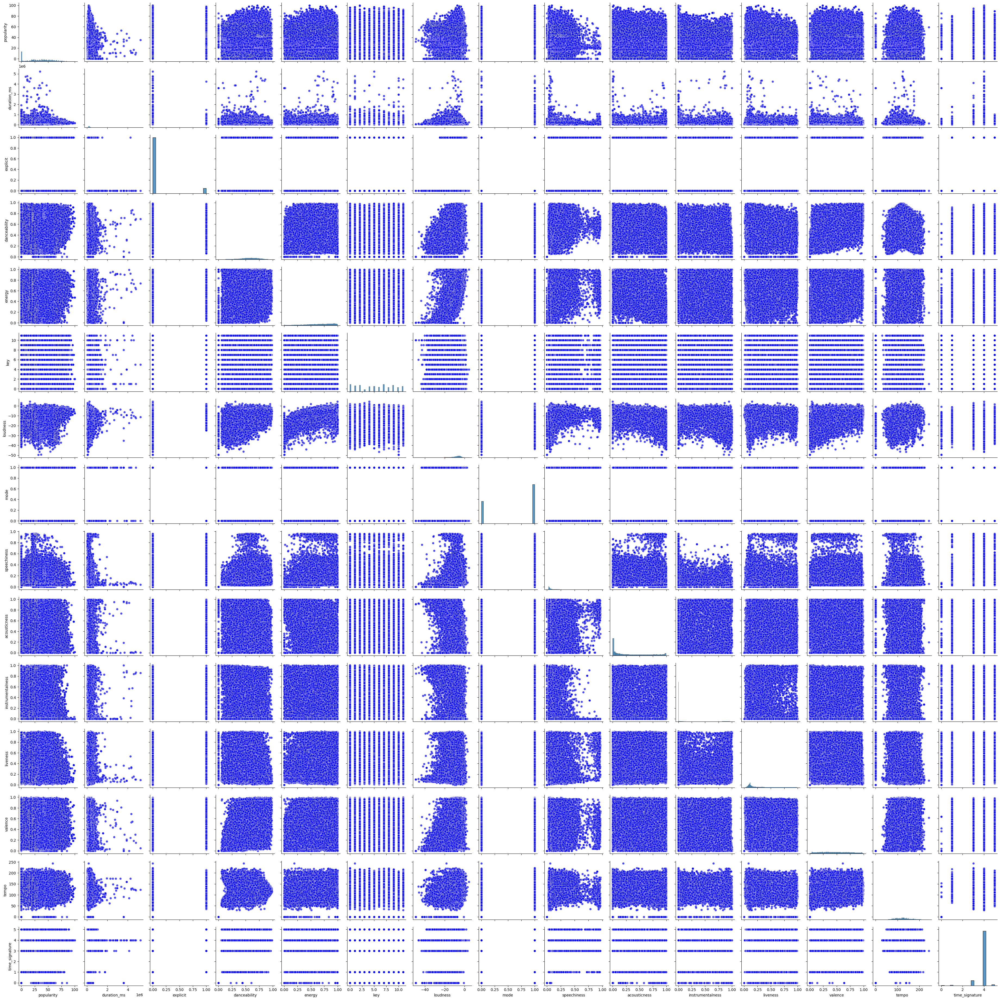

In [21]:
# Create a pairplot with histograms on the diagonal
sns.pairplot(df, plot_kws={'alpha':0.7, 'color':'blue'})

# Show the plot
plt.show()


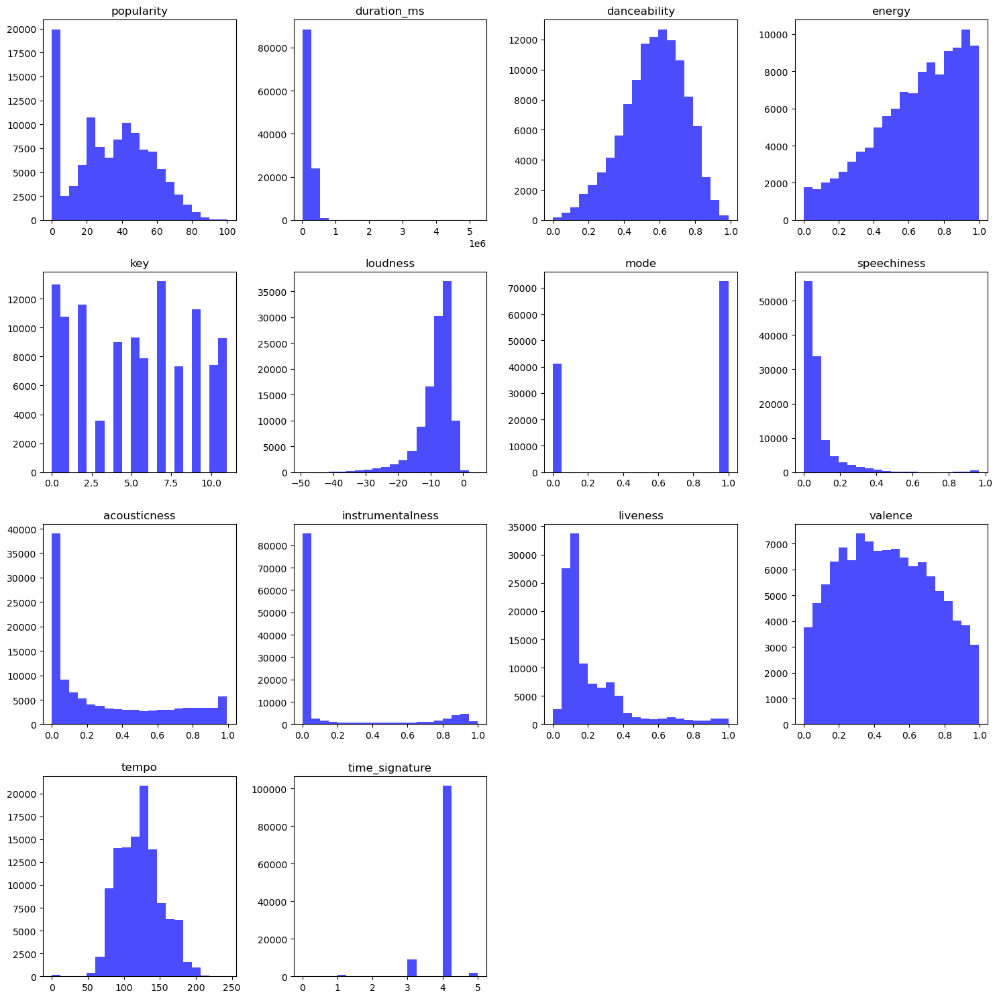

In [22]:
# Select numerical columns
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
# Create a grid of histograms
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))  # Adjust rows and columns for your data
axes = axes.flatten()  # Flatten axes for easy iteration

for i, col in enumerate(numerical_cols):
    if i < len(axes):  # Plot only if there's a corresponding axis
        axes[i].hist(df[col].dropna(), bins=20, color='blue', alpha=0.7)  # Plot histogram
        axes[i].set_title(col)  # Set title as column name

# Remove empty subplots
for i in range(len(numerical_cols), len(axes)):
    fig.delaxes(axes[i])

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

#### Numerical features

In [23]:
numerical = [f for f in df.columns if df.dtypes[f] != 'object']
print(numerical)
numerical_but_continuous = [f for f in numerical if len(df[f].unique()) > 20]
print(numerical_but_continuous)
numerical_but_discrete = list(set(numerical) - set(numerical_but_continuous))
print(numerical_but_discrete)

['popularity', 'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']
['popularity', 'duration_ms', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
['mode', 'explicit', 'key', 'time_signature']


##### Discrete

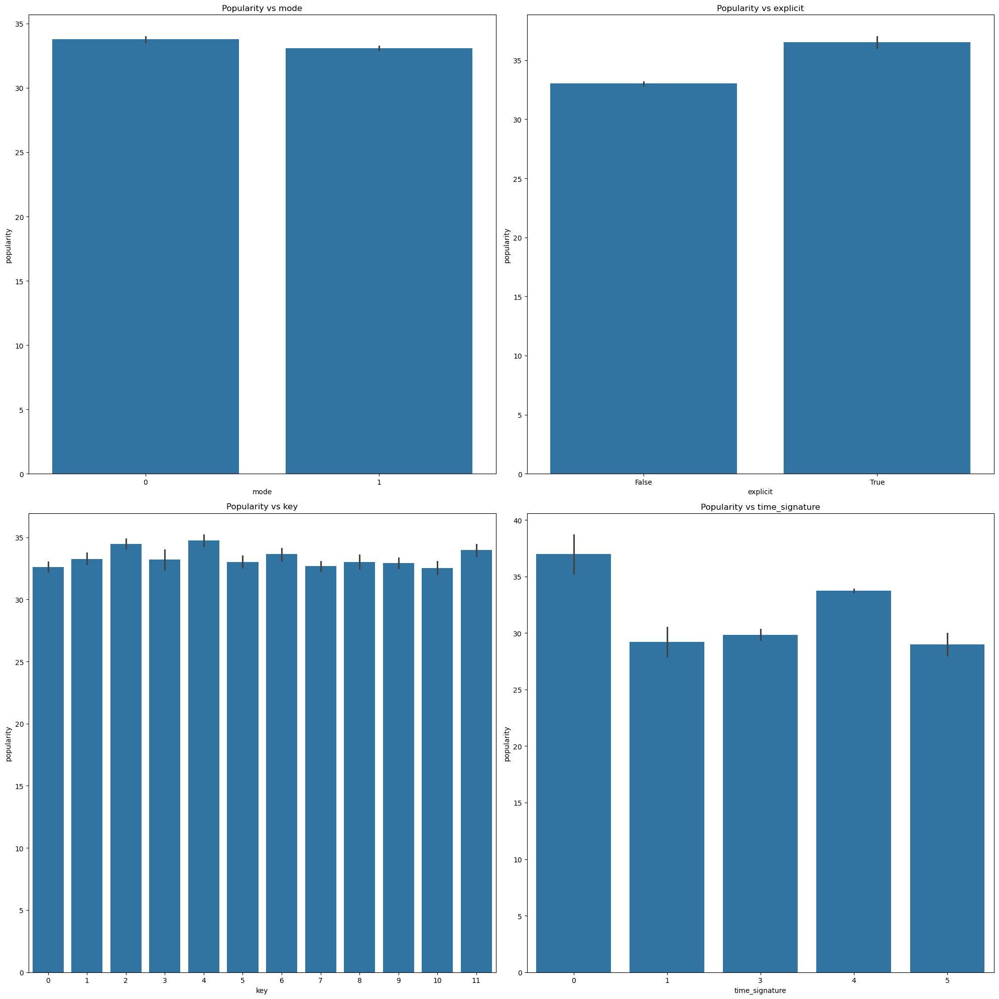

In [24]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
axes = axes.flatten()

for i, f in enumerate(numerical_but_discrete):
    sns.barplot(x=f, y='popularity', data=df, ax=axes[i])
    axes[i].set_title(f'Popularity vs {f}')

# Remove any unused subplots
for j in range(len(numerical_but_discrete), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Songs with explicity lyrics seem to be more popular than non-explicit ones.

Time signature 0 and 4 seem to make a song more popular.

`--> time_signature: An estimated time signature. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure). The time signature ranges from 3 to 7 indicating time signatures of 3/4, to 7/4.`

Other two features seem to be more or less the same for all of their values.

##### Continuous

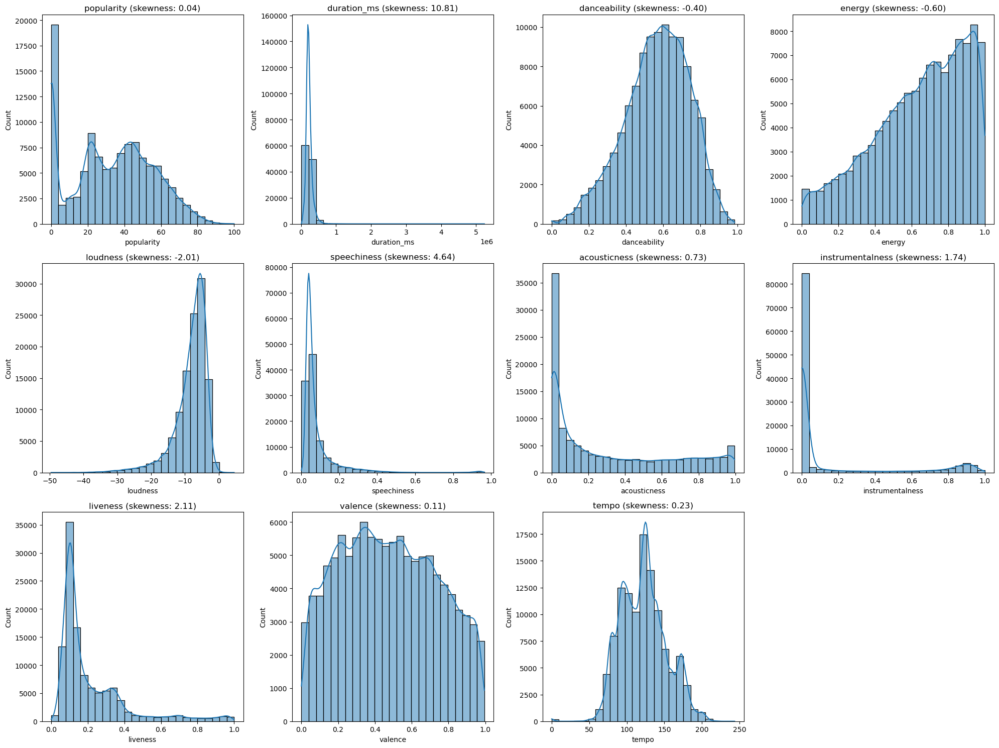

In [25]:
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))
axes = axes.flatten()

for i, f in enumerate(numerical_but_continuous):
    if i < len(axes):
        sns.histplot(x=f, data=df, bins=25, kde=True, ax=axes[i])
        axes[i].set_title(f'{f} (skewness: {skew(df[f]):.2f})')

# Remove any unused subplots
for j in range(len(numerical_but_continuous), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Danceability, valence and tempo are +- normally distributed

Loudness is left skewed

Rest are right skewed

`--> Need to take this into account when doing multivariate analysis, as this can seriously impact your results`

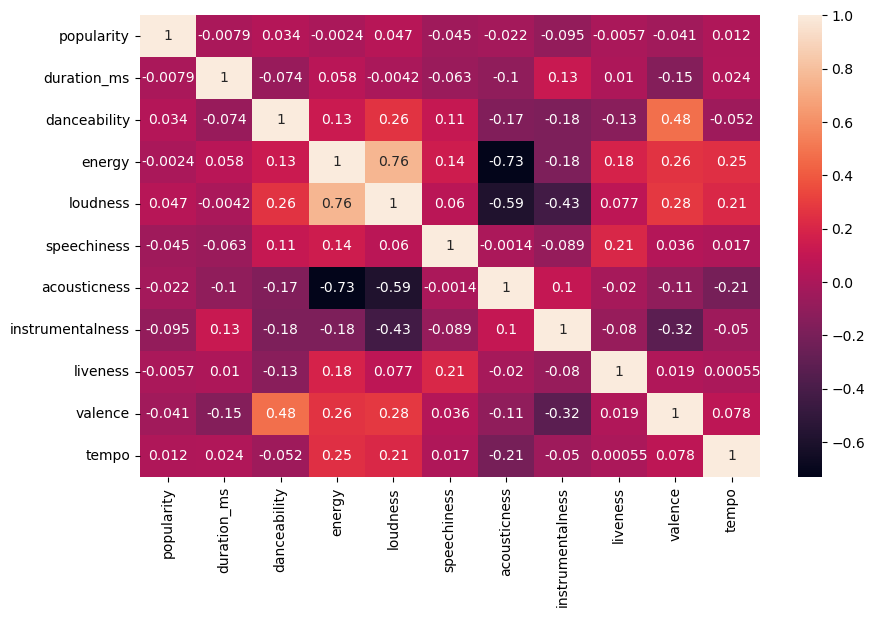

In [26]:
plt.figure(figsize=(10,6))
sns.heatmap(df[numerical_but_continuous].corr(), annot=True)
plt.show()

None of the continuous features has a great correlation with popularity.

Energy also seems to be highly correlated with loudness, so we'll remove one of the two. Here loudness.

In [27]:
# Drop the 'loudness' column from the DataFrame
df= df.drop(columns=['energy'])

# Update the lists of numerical and continuous variables
numerical= [col for col in numerical if col != 'energy']
numerical_but_continuous = [col for col in numerical_but_continuous if col != 'energy']

print(df.head())
print(numerical)
print(numerical_but_continuous)

                 track_id                 artists  \
0  5SuOikwiRyPMVoIQDJUgSV             Gen Hoshino   
1  4qPNDBW1i3p13qLCt0Ki3A            Ben Woodward   
2  1iJBSr7s7jYXzM8EGcbK5b  Ingrid Michaelson;ZAYN   
3  6lfxq3CG4xtTiEg7opyCyx            Kina Grannis   
4  5vjLSffimiIP26QG5WcN2K        Chord Overstreet   

                                          album_name  \
0                                             Comedy   
1                                   Ghost (Acoustic)   
2                                     To Begin Again   
3  Crazy Rich Asians (Original Motion Picture Sou...   
4                                            Hold On   

                   track_name  popularity  duration_ms  explicit  \
0                      Comedy          73       230666     False   
1            Ghost - Acoustic          55       149610     False   
2              To Begin Again          57       210826     False   
3  Can't Help Falling In Love          71       201933     False   
4   

###### Try to fix Skewness

/home/august-winderickx/miniconda3/envs/DR/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/august-winderickx/miniconda3/envs/DR/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/august-winderickx/miniconda3/envs/DR/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_11179/1129408706.py:23: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(plot_data, ax=ax)


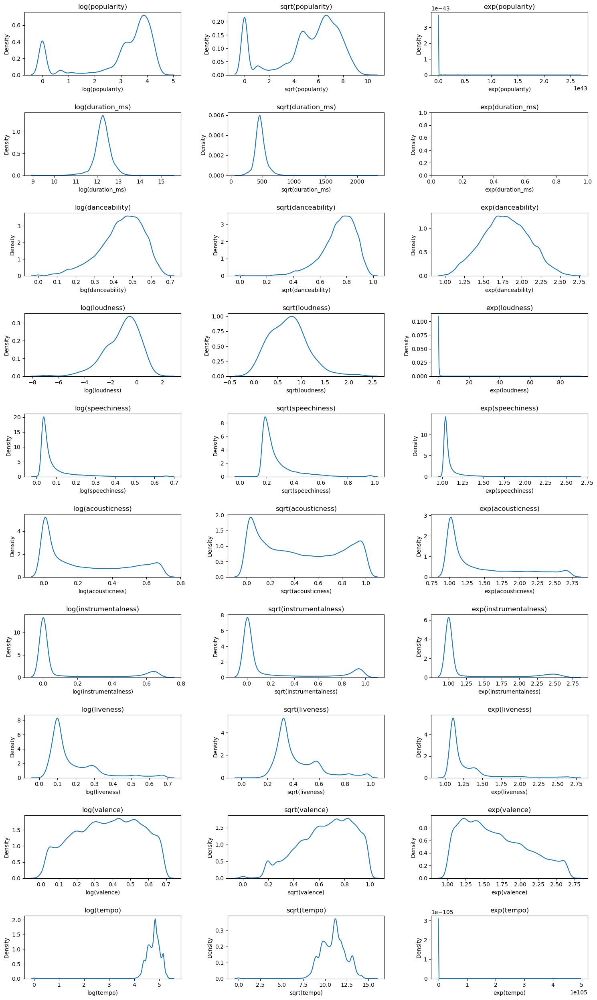

In [28]:
# Create a new DataFrame with transformed features
new_df = pd.DataFrame()
for col_name in numerical_but_continuous:
    new_df[f'log({col_name})'] = np.log1p(df[col_name])
    new_df[f'sqrt({col_name})'] = np.sqrt(df[col_name])
    new_df[f'exp({col_name})'] = np.exp(df[col_name])

# Plot settings
plot_cols = 3
fig_width = 15
fig_height = 25
subplot_width = fig_width / plot_cols
subplot_height = fig_height / (len(numerical_but_continuous) / plot_cols)

fig, axes = plt.subplots(len(numerical_but_continuous), plot_cols, figsize=(fig_width, fig_height))

# Loop through each column/transformation combination and plot using subplots with Seaborn
for i, col_name in enumerate(numerical_but_continuous):
    for j, transform in enumerate(['log', 'sqrt', 'exp']):
        plot_data = new_df[f"{transform}({col_name})"]
        plot_title = f"{transform}({col_name})"
        ax = axes[i, j]
        sns.kdeplot(plot_data, ax=ax)
        ax.set_title(plot_title)

# Adjust spacing and labels
plt.tight_layout()
plt.subplots_adjust(hspace=0.6, wspace=0.3)
plt.show()

None of the transformation seem to be having a huge effect except for log(duration_ms) and exp(danceability), so we'll let it be.

###### **Outliers**

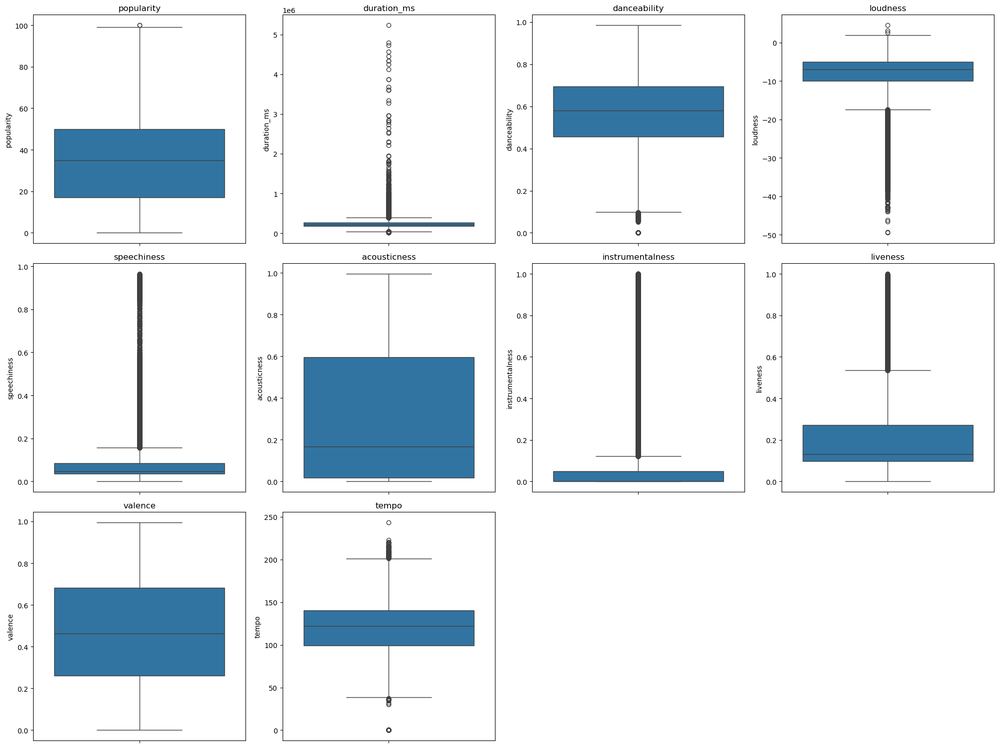

In [29]:

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))
axes = axes.flatten()

for i, f in enumerate(numerical_but_continuous):
    sns.boxplot(data=df[f], ax=axes[i])
    axes[i].set_title(f)

# Remove any unused subplots
for j in range(len(numerical_but_continuous), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Apart from energy, acousticness, and valence, most features exhibit a significant number of outliers.

###### Normalisation

In [30]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Exclude 'popularity' from numerical_but_continuous
features_to_scale = [col for col in numerical_but_continuous if col != 'popularity']
print(features_to_scale)
# Fit and transform the continuous numerical features
df[features_to_scale] = scaler.fit_transform(df[features_to_scale])

# Display the first few rows of the normalized dataframe
print(df.head())

['duration_ms', 'danceability', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
                 track_id                 artists  \
0  5SuOikwiRyPMVoIQDJUgSV             Gen Hoshino   
1  4qPNDBW1i3p13qLCt0Ki3A            Ben Woodward   
2  1iJBSr7s7jYXzM8EGcbK5b  Ingrid Michaelson;ZAYN   
3  6lfxq3CG4xtTiEg7opyCyx            Kina Grannis   
4  5vjLSffimiIP26QG5WcN2K        Chord Overstreet   

                                          album_name  \
0                                             Comedy   
1                                   Ghost (Acoustic)   
2                                     To Begin Again   
3  Crazy Rich Asians (Original Motion Picture Sou...   
4                                            Hold On   

                   track_name  popularity  duration_ms  explicit  \
0                      Comedy          73     0.024289     False   
1            Ghost - Acoustic          55    -0.737425     False   
2            

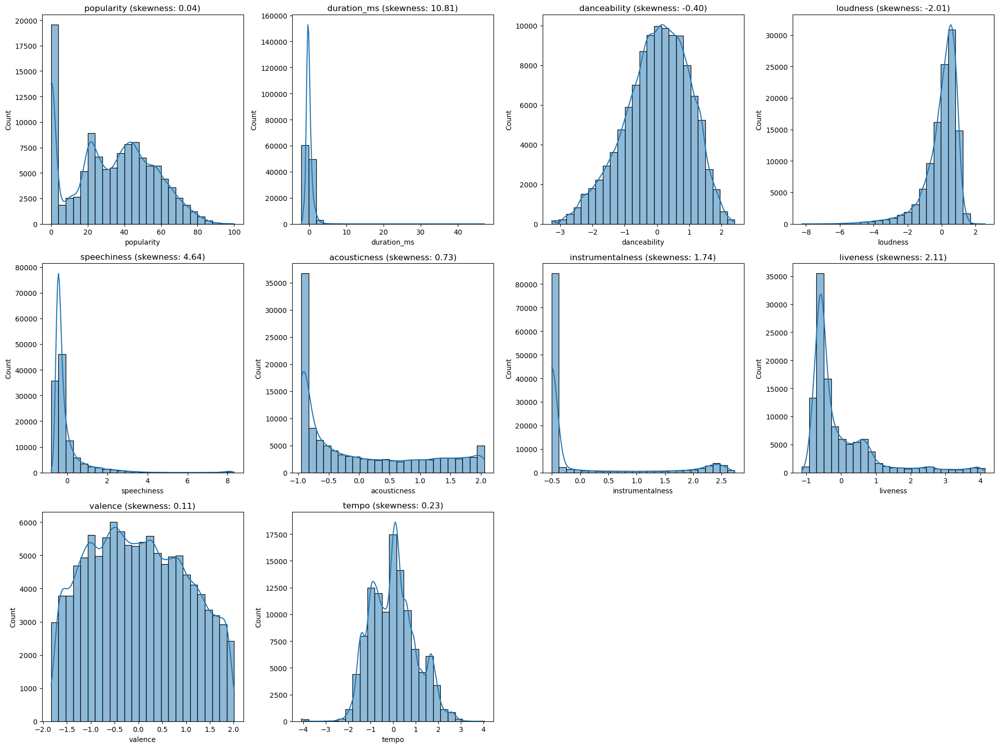

In [31]:
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))
axes = axes.flatten()

for i, f in enumerate(numerical_but_continuous):
    if i < len(axes):
        sns.histplot(x=f, data=df, bins=25, kde=True, ax=axes[i])
        axes[i].set_title(f'{f} (skewness: {skew(df[f]):.2f})')

# Remove any unused subplots
for j in range(len(numerical_but_continuous), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

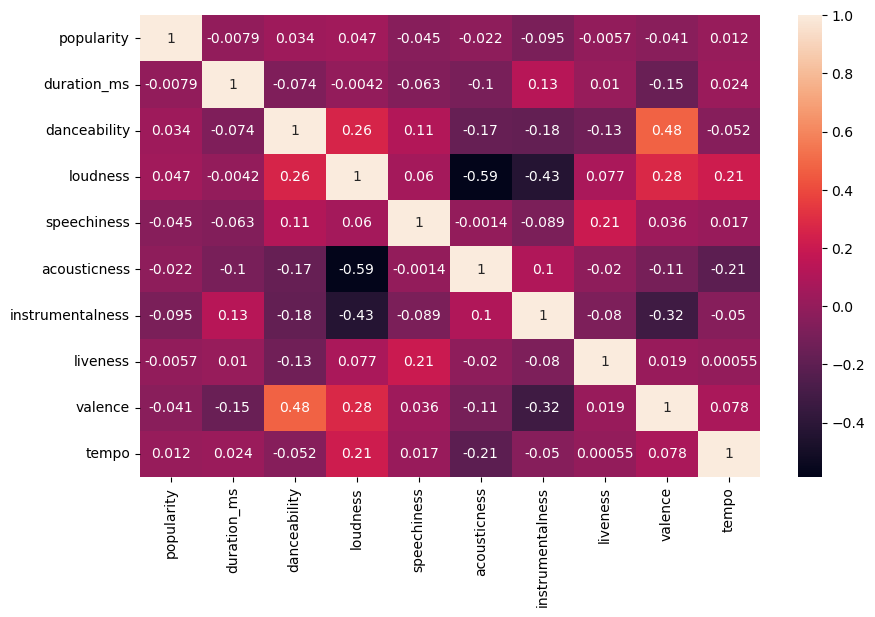

In [32]:
plt.figure(figsize=(10,6))
sns.heatmap(df[numerical_but_continuous].corr(), annot=True)
plt.show()

#### Categorical features

In [33]:
categorical = [f for f in df.columns if df[f].dtypes=='O']
print(categorical)


['track_id', 'artists', 'album_name', 'track_name', 'track_genre']


Out of these categorical variables, only artist and track_genre will have an effect on the popularity of a song. So we'll drop the other 3.

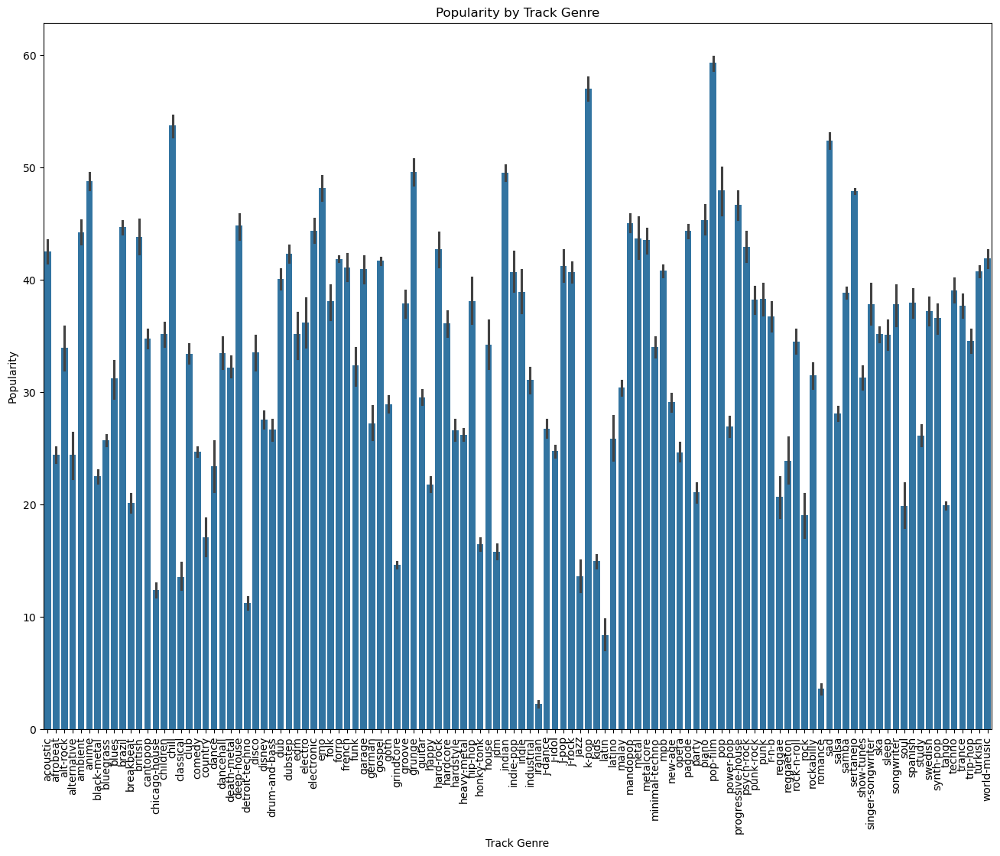

In [34]:
plt.figure(figsize=(16, 12))
sns.barplot(x='track_genre', y='popularity', data=df, estimator=np.mean)  # Use mean or another estimator if needed
plt.xticks(rotation=90)
plt.title('Popularity by Track Genre')
plt.xlabel('Track Genre')
plt.ylabel('Popularity')
plt.show()

The 3 most popular genres seem to be pop-film, k-pop and chill.

In [35]:
print(df.head(20))

                  track_id                               artists  \
0   5SuOikwiRyPMVoIQDJUgSV                           Gen Hoshino   
1   4qPNDBW1i3p13qLCt0Ki3A                          Ben Woodward   
2   1iJBSr7s7jYXzM8EGcbK5b                Ingrid Michaelson;ZAYN   
3   6lfxq3CG4xtTiEg7opyCyx                          Kina Grannis   
4   5vjLSffimiIP26QG5WcN2K                      Chord Overstreet   
5   01MVOl9KtVTNfFiBU9I7dc                          Tyrone Wells   
6   6Vc5wAMmXdKIAM7WUoEb7N  A Great Big World;Christina Aguilera   
7   1EzrEOXmMH3G43AXT1y7pA                            Jason Mraz   
8   0IktbUcnAGrvD03AWnz3Q8             Jason Mraz;Colbie Caillat   
9   7k9GuJYLp2AzqokyEdwEw2                        Ross Copperman   
10  4mzP5mHkRvGxdhdGdAH7EJ                          Zack Tabudlo   
11  5ivF4eQBqJiVL5IAE9jRyl                            Jason Mraz   
12  4ptDJbJl35d7gQfeNteBwp                              Dan Berk   
13  0X9MxHR1rTkEHDjp95F2OO                      

In [36]:
final_df = df.drop(columns=['track_id','album_name' ,'track_name'], axis=1)

In [37]:
print(final_df.head(20))

                                 artists  popularity  duration_ms  explicit  \
0                            Gen Hoshino          73     0.024289     False   
1                           Ben Woodward          55    -0.737425     False   
2                 Ingrid Michaelson;ZAYN          57    -0.162155     False   
3                           Kina Grannis          71    -0.245726     False   
4                       Chord Overstreet          82    -0.274670     False   
5                           Tyrone Wells          58    -0.130073     False   
6   A Great Big World;Christina Aguilera          74     0.012392     False   
7                             Jason Mraz          80     0.139689     False   
8              Jason Mraz;Colbie Caillat          74    -0.361502     False   
9                         Ross Copperman          56    -0.211322     False   
10                          Zack Tabudlo          74     0.157111     False   
11                            Jason Mraz          69

###### Encoding of categorical variables

In [38]:
encoded_df = pd.get_dummies(final_df, columns=['track_genre'])
print(encoded_df.head())

                  artists  popularity  duration_ms  explicit  danceability  \
0             Gen Hoshino          73     0.024289     False      0.628394   
1            Ben Woodward          55    -0.737425     False     -0.847891   
2  Ingrid Michaelson;ZAYN          57    -0.162155     False     -0.744089   
3            Kina Grannis          71    -0.245726     False     -1.735968   
4        Chord Overstreet          82    -0.274670     False      0.293923   

   key  loudness  mode  speechiness  acousticness  ...  track_genre_spanish  \
0    1  0.298800     0     0.551483     -0.849230  ...                False   
1    1 -1.794228     1    -0.079182      1.837684  ...                False   
2    0 -0.297440     1    -0.273960     -0.313535  ...                False   
3    0 -2.049645     1    -0.457392      1.780439  ...                False   
4    2 -0.286864     1    -0.303272      0.466809  ...                False   

   track_genre_study  track_genre_swedish  track_genre_s

## Dimensionality reduction

### SVD

Can only be performed with numerical data

#### Popularity

In [39]:
print(numerical)

['popularity', 'duration_ms', 'explicit', 'danceability', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']


In [40]:
df_numeric = df[numerical].drop(columns=['popularity'])

In [41]:
print(df_numeric.head())

   duration_ms  explicit  danceability  key  loudness  mode  speechiness  \
0     0.024289     False      0.628394    1  0.298800     0     0.551483   
1    -0.737425     False     -0.847891    1 -1.794228     1    -0.079182   
2    -0.162155     False     -0.744089    0 -0.297440     1    -0.273960   
3    -0.245726     False     -1.735968    0 -2.049645     1    -0.457392   
4    -0.274670     False      0.293923    2 -0.286864     1    -0.303272   

   acousticness  instrumentalness  liveness   valence     tempo  \
0     -0.849230         -0.503538  0.758094  0.928984 -1.142994   
1      1.837684         -0.503524 -0.591264 -0.799395 -1.490909   
2     -0.313535         -0.503542 -0.507257 -1.366520 -1.529510   
3      1.780439         -0.503313 -0.428501 -1.277786  1.987275   
4      0.466809         -0.503542 -0.686296 -1.185194 -0.074292   

   time_signature  
0               4  
1               4  
2               4  
3               3  
4               4  


In [42]:
print("\nData types of each column:")
for col in df_numeric.columns:
    print(f'{col}: {df_numeric[col].dtype}')


Data types of each column:
duration_ms: float64
explicit: bool
danceability: float64
key: int64
loudness: float64
mode: int64
speechiness: float64
acousticness: float64
instrumentalness: float64
liveness: float64
valence: float64
tempo: float64
time_signature: int64


In [43]:
for n_components in range(1, 11):
    svd = TruncatedSVD(n_components=n_components)
    sklearn_svd = svd.fit_transform(df_numeric)
    explained_variance_ratio = svd.explained_variance_ratio_
    total_variance_explained = sum(explained_variance_ratio) * 100
    print(f"\nNumber of components: {n_components}")
    print("Explained variance ratio:", explained_variance_ratio)
    print(f"Total variance explained: {total_variance_explained:.2f}%")


Number of components: 1
Explained variance ratio: [0.43389531]
Total variance explained: 43.39%

Number of components: 2
Explained variance ratio: [0.43389531 0.14660026]
Total variance explained: 58.05%

Number of components: 3
Explained variance ratio: [0.43389531 0.14660026 0.10203077]
Total variance explained: 68.25%

Number of components: 4
Explained variance ratio: [0.43389531 0.14660026 0.10203077 0.06195766]
Total variance explained: 74.45%

Number of components: 5
Explained variance ratio: [0.43389531 0.14660026 0.10203077 0.06195766 0.05558844]
Total variance explained: 80.01%

Number of components: 6
Explained variance ratio: [0.43389531 0.14660026 0.10203077 0.06195766 0.05558844 0.04377745]
Total variance explained: 84.38%

Number of components: 7
Explained variance ratio: [0.43389531 0.14660026 0.10203077 0.06195766 0.05558844 0.04377745
 0.04014694]
Total variance explained: 88.40%

Number of components: 8
Explained variance ratio: [0.43389531 0.14660026 0.10203077 0.06

In [44]:
svd = TruncatedSVD(n_components=7)
sklearn_svd = svd.fit_transform(df_numeric)

In [45]:
# Define the bins and labels for the popularity ranges
bins = [0, 33, 66, 100]
labels = ['Low', 'Medium', 'High']

# Create a new DataFrame with the popularity range column
df_poprange = df.copy()
df_poprange['popularity_range'] = pd.cut(df_poprange['popularity'], bins=bins, labels=labels, include_lowest=True)

# Display the first few rows of the new DataFrame
print(df_poprange.head())

                 track_id                 artists  \
0  5SuOikwiRyPMVoIQDJUgSV             Gen Hoshino   
1  4qPNDBW1i3p13qLCt0Ki3A            Ben Woodward   
2  1iJBSr7s7jYXzM8EGcbK5b  Ingrid Michaelson;ZAYN   
3  6lfxq3CG4xtTiEg7opyCyx            Kina Grannis   
4  5vjLSffimiIP26QG5WcN2K        Chord Overstreet   

                                          album_name  \
0                                             Comedy   
1                                   Ghost (Acoustic)   
2                                     To Begin Again   
3  Crazy Rich Asians (Original Motion Picture Sou...   
4                                            Hold On   

                   track_name  popularity  duration_ms  explicit  \
0                      Comedy          73     0.024289     False   
1            Ghost - Acoustic          55    -0.737425     False   
2              To Begin Again          57    -0.162155     False   
3  Can't Help Falling In Love          71    -0.245726     False   
4   

7 components explains almost 90% of the variance.
3 seems to be most efficient.

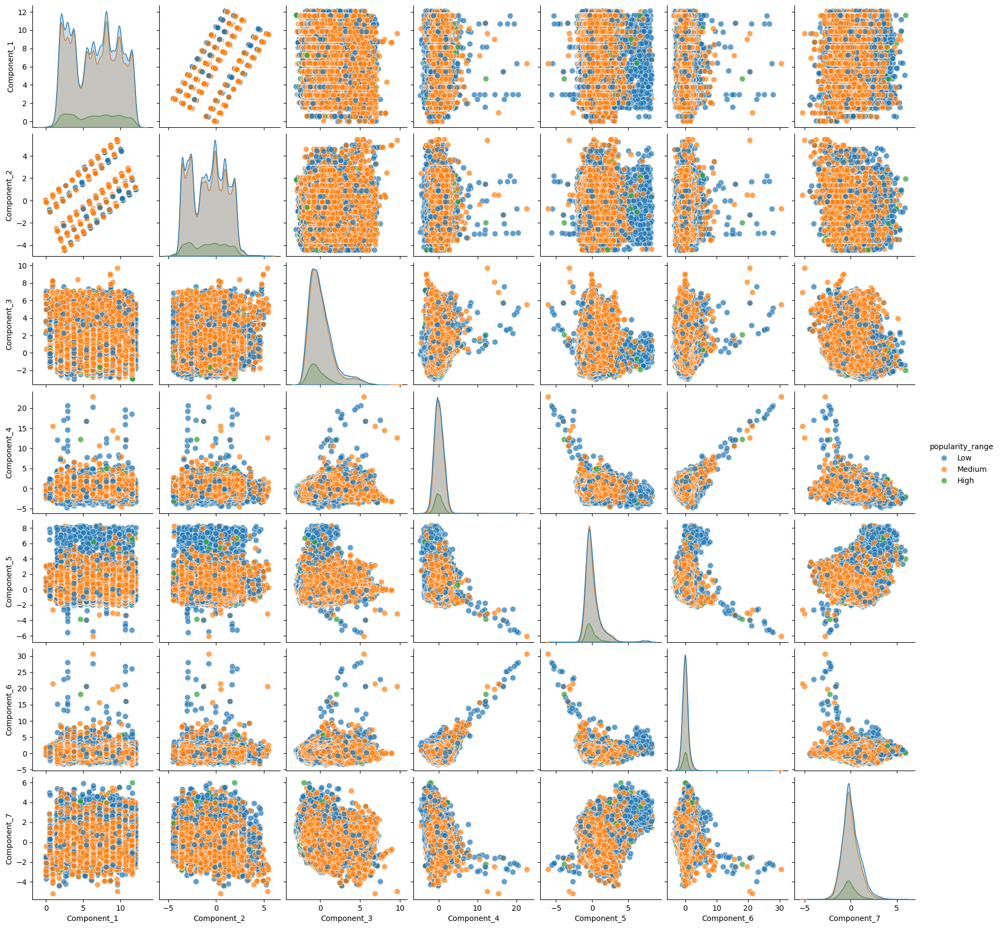

In [46]:
# Create a DataFrame with the reduced dimensions
reduced_df = pd.DataFrame(sklearn_svd, columns=[f'Component_{i+1}' for i in range(sklearn_svd.shape[1])])

# Combine the reduced dimensions with the popularity range
reduced_df['popularity_range'] = df_poprange['popularity_range']

# Plot the pairplot
sns.pairplot(reduced_df, hue='popularity_range', plot_kws={'alpha': 0.7, 's': 60})
plt.show()

In [47]:
# Create a DataFrame with the reduced dimensions
reduced_df = pd.DataFrame(sklearn_svd, columns=[f'svd_{i+1}' for i in range(sklearn_svd.shape[1])])

# Combine the original DataFrame with the SVD components
svd_df = pd.concat([df_poprange, reduced_df], axis=1)

# Display the first few rows of the combined DataFrame
print(svd_df.head())

                 track_id                 artists  \
0  5SuOikwiRyPMVoIQDJUgSV             Gen Hoshino   
1  4qPNDBW1i3p13qLCt0Ki3A            Ben Woodward   
2  1iJBSr7s7jYXzM8EGcbK5b  Ingrid Michaelson;ZAYN   
3  6lfxq3CG4xtTiEg7opyCyx            Kina Grannis   
4  5vjLSffimiIP26QG5WcN2K        Chord Overstreet   

                                          album_name  \
0                                             Comedy   
1                                   Ghost (Acoustic)   
2                                     To Begin Again   
3  Crazy Rich Asians (Original Motion Picture Sou...   
4                                            Hold On   

                   track_name  popularity  duration_ms explicit  danceability  \
0                      Comedy        73.0     0.024289    False      0.628394   
1            Ghost - Acoustic        55.0    -0.737425    False     -0.847891   
2              To Begin Again        57.0    -0.162155    False     -0.744089   
3  Can't Help Fallin

#### Track genre

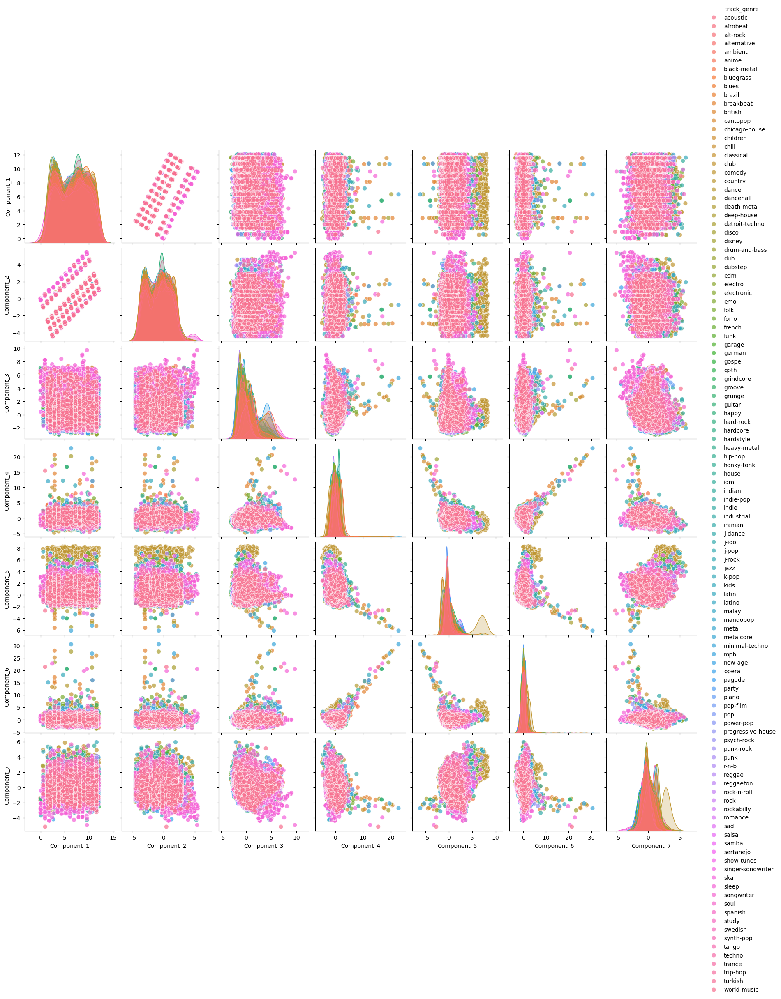

In [48]:
# Create a DataFrame with the reduced dimensions
reduced_df = pd.DataFrame(sklearn_svd, columns=[f'Component_{i+1}' for i in range(sklearn_svd.shape[1])])

# Combine the reduced dimensions with the track genres
reduced_df['track_genre'] = df_poprange['track_genre']

# Plot the pairplot
sns.pairplot(reduced_df, hue='track_genre', plot_kws={'alpha': 0.7, 's': 60})
plt.show()

## PCA

Eigenvalues (variance explained by each PC): [12.68664941  2.26916603  1.37367369  1.23387926  0.97075691  0.89010329]
Explained variance ratio: [0.57222583 0.10234975 0.06195896 0.05565359 0.04378557 0.04014772]


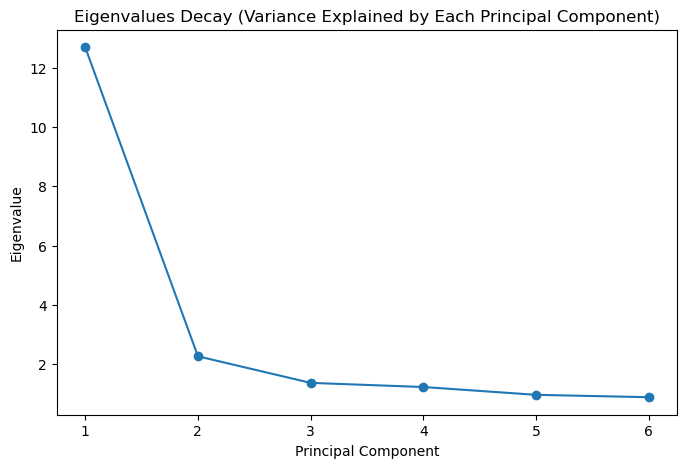

In [49]:
# Apply PCA
pca_test = PCA(n_components=6)
pca_test_transformed = pca_test.fit_transform(df_numeric)

# Get eigenvalues and explained variance ratio
eigenvalues = pca_test.explained_variance_
explained_variance_ratio = pca_test.explained_variance_ratio_

# Print the eigenvalues
print("Eigenvalues (variance explained by each PC):", eigenvalues)

# Print the explained variance ratio
print("Explained variance ratio:", explained_variance_ratio)

# Plot the explained variance to visualize eigenvalues decay
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, marker='o', linestyle='-')
plt.title('Eigenvalues Decay (Variance Explained by Each Principal Component)')
plt.xlabel('Principal Component')
plt.ylabel('Eigenvalue')
plt.show()

4 principal companents seem to be adequate

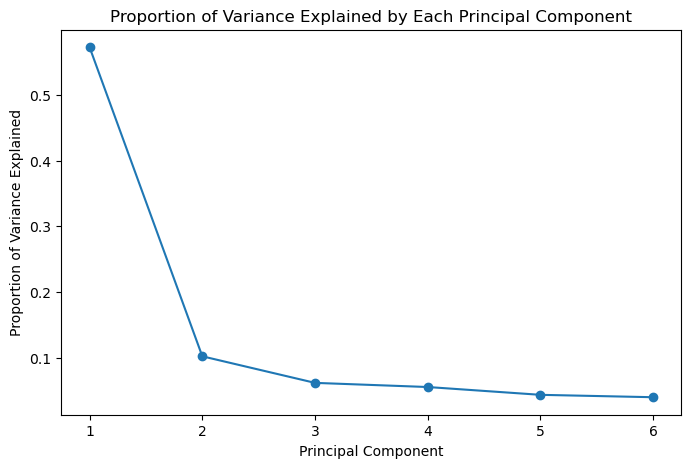

In [50]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='-')
plt.title('Proportion of Variance Explained by Each Principal Component')
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.show()

In [51]:
pca_df = pd.DataFrame(pca_test_transformed, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'])	

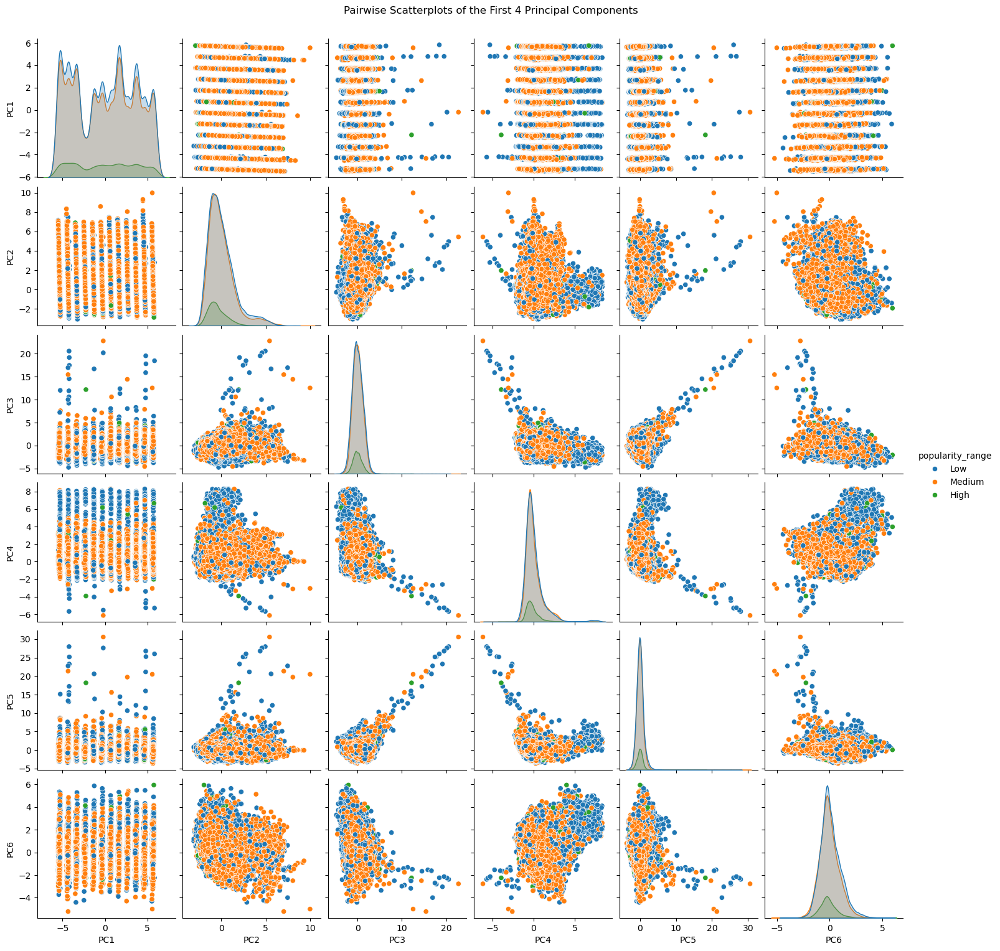

In [52]:
# Ensure the 'popularity_range' column is added to the pca_df DataFrame
pca_df_with_popularity = pca_df.copy()
pca_df_with_popularity['popularity_range'] = df_poprange['popularity_range']

# Create the pairplot
sns.pairplot(pca_df_with_popularity, hue='popularity_range')
plt.suptitle('Pairwise Scatterplots of the First 4 Principal Components', y=1.02)
plt.show()

Clusters seem to be separated in a different dimension. So it isn't linear as seen in the examples during the lecture.

In [53]:
from sklearn.decomposition import KernelPCA

## Unsupervised learning - clustering

In [ ]:
# For the data clustering, we can only have numerical values, 
# so we will remove the "Class" variable.